# cGAN using pix2pix


## Importing the libraries

In [4]:
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display
import tensorflow as tf
tf.__version__

'2.12.0'

## Downloading the dataset

In [5]:
dataset = 'maps'



Other datasets:
* `cityscapes`
* `edges2handbags`
* `edges2shoes`
* `facades`
* `night2day`

(https://github.com/affinelayer/pix2pix-tensorflow#datasets-and-trained-models)

In [6]:
dataset_file = "{}.tar.gz".format(dataset)
dataset_url = "http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{}".format(dataset_file)
print(dataset_url)

http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz


In [7]:
download_zip = tf.keras.utils.get_file(fname = dataset_file, origin = dataset_url, extract = True)

250242400/250242400 [==============================] - 246s 1us/step


In [8]:
download_zip = pathlib.Path(download_zip)
path = download_zip.parent/dataset

In [9]:
path

PosixPath('/root/.keras/datasets/maps')

In [10]:
#Dataset is stores in an internal folder of google colab and hence not visible
list(path.parent.iterdir())

[PosixPath('/root/.keras/datasets/maps.tar.gz'),
 PosixPath('/root/.keras/datasets/maps')]

In [11]:
#All training images are in train folder
sample = tf.io.read_file(str(path / 'train/7.jpg'))
#Convert image from tensorflow format to jpeg format
sample = tf.io.decode_jpeg(sample)

(600, 1200, 3)


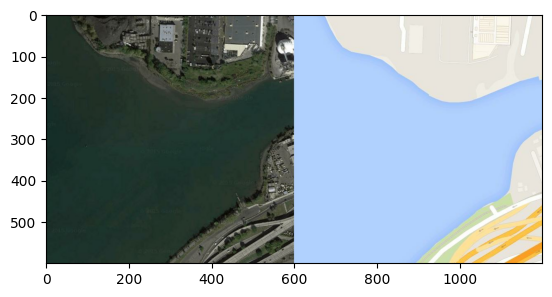

In [12]:
print(sample.shape)
#Image is 600x1200 and RGB -3 channel
plt.figure()
plt.imshow(sample);

## Functions to preprocessing

In [13]:
#Read the image and seperate it into image and corresponding map and return 2 images
def load_image(img_file):
  #Read image in tensorflow format
  img = tf.io.read_file(img_file)
  #Convert image from tensorflow to jpg format
  img = tf.io.decode_jpeg(img)
  #Resize images so that it is compatible with pix2pix architecture
  img = tf.image.resize(img, [256, 512])
  #print(img.shape)

  #Seperate image into image and map by dividing it to two halves based on width
  width = tf.shape(img)[1]
  #print(width)
  width = width // 2
  #print(width)
  original_img = img[:, :width, :]
  transformed_img = img[:, width:, :]
  #Convert images datatype to float
  original_img = tf.cast(original_img, tf.float32)
  transformed_img = tf.cast(transformed_img, tf.float32)

  return original_img, transformed_img

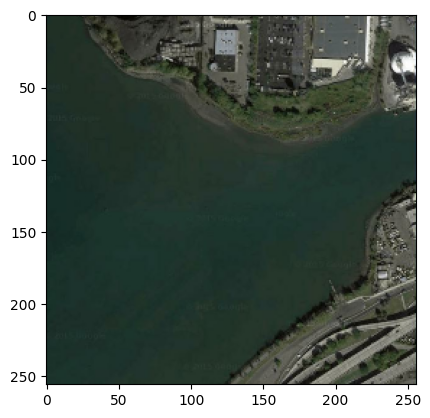

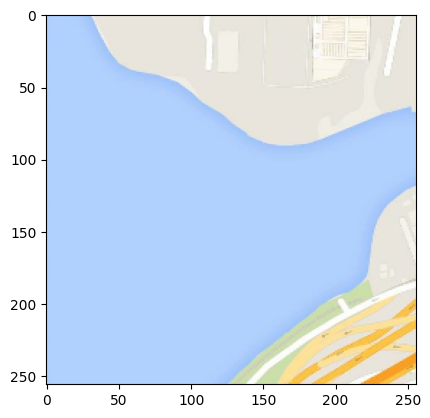

In [14]:
original_img, transformed_img = load_image(str(path / 'train/7.jpg'))
plt.figure()
plt.imshow(original_img / 255.0)
plt.figure()
plt.imshow(transformed_img / 255.0);

In [15]:
quantity_training = tf.data.Dataset.list_files(str(path / 'train/*.jpg'))
quantity_training

<_ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

In [16]:
#Get the no of training images
quantity_training = len(list(quantity_training))
quantity_training

1096

In [17]:
buffer_size = quantity_training
batch_size = 1
img_width = 256
img_height = 256

In [18]:
#Resize the images to recommended ht and width 256x256
def resize(original_img, transformed_img, width, height):
  original_img = tf.image.resize(original_img, [width, height], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  transformed_img = tf.image.resize(transformed_img, [width, height], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return original_img, transformed_img

In [19]:
#Range -1 to 1 normalization for images
def normalize(original_img, transformed_img):
  original_img = (original_img / 127.5) - 1
  transformed_img = (transformed_img / 127.5) - 1
  return original_img, transformed_img

In [20]:
# Crop images
def random_crop(original_img, transformed_img):
  stacked_img = tf.stack([original_img, transformed_img], axis = 0)
  crop_img = tf.image.random_crop(stacked_img, size = [2, img_width, img_height, 3])
  return crop_img[0], crop_img[1]

In [21]:
tf.random.uniform(())

<tf.Tensor: shape=(), dtype=float32, numpy=0.7774453>

In [22]:
@tf.function()
def random_jitter(original_img, transformed_img):
  #First resize images
  original_img, transformed_img = resize(original_img, transformed_img, 286, 286)
  #Crop the images
  original_img, transformed_img = random_crop(original_img, transformed_img)
  #Apply transformation in image only if value is >0.5 ie 50% probability of applying this transformation
  if tf.random.uniform(()) > 0.5:
    original_img = tf.image.flip_left_right(original_img)
    transformed_img = tf.image.flip_left_right(transformed_img)
  return original_img, transformed_img

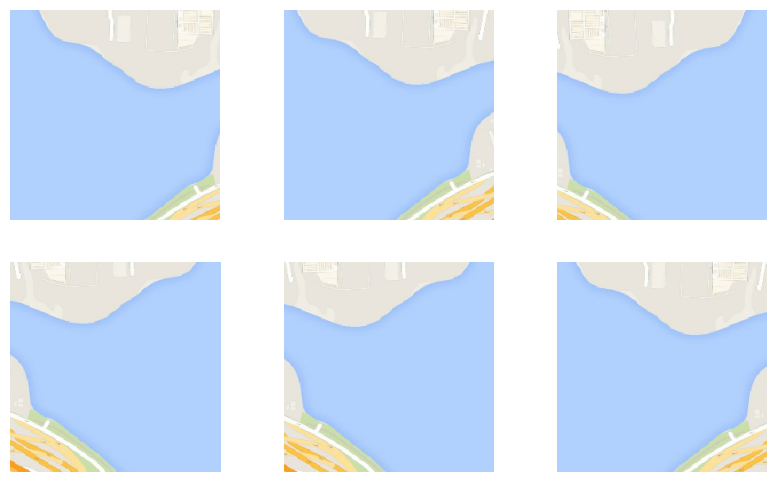

In [23]:
plt.figure(figsize = (10,6))
for i in range(6):
  j_original, j_transformed = random_jitter(original_img, transformed_img)
  plt.subplot(2,3, i + 1)
  plt.imshow(j_transformed / 255.0)
  plt.axis('off')
plt.show()

## Loading the dataset


In [24]:
#Read and pre process the train images
def load_training_images(img_file):
  original_img, transformed_img = load_image(img_file)
  original_img, transformed_img = random_jitter(original_img, transformed_img)
  original_img, transformed_img = normalize(original_img, transformed_img)
  return original_img, transformed_img

In [25]:
#Read and pre process the test images
def load_testing_images(img_file):
  original_img, transformed_img = load_image(img_file)
  #No need of calling random_jitter for test images
  original_img, transformed_img = resize(original_img, transformed_img, img_width, img_height)
  original_img, transformed_img = normalize(original_img, transformed_img)
  return original_img, transformed_img

In [26]:
#Create train dataset
training_dataset = tf.data.Dataset.list_files(str(path / 'train/*.jpg'))
training_dataset = training_dataset.map(load_training_images, num_parallel_calls=tf.data.AUTOTUNE)
training_dataset = training_dataset.shuffle(buffer_size)
training_dataset = training_dataset.batch(batch_size)

In [27]:
training_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [28]:
try:
  testing_dataset = tf.data.Dataset.list_files(str(path / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  testing_dataset = tf.data.Dataset.list_files(str(path / 'val/*.jpg'))
testing_dataset = testing_dataset.map(load_testing_images)
testing_dataset = testing_dataset.batch(batch_size)

## Generator

The generator is a modified version of [U-Net](https://paperswithcode.com/method/u-net).

U-Net components:
* Encoder (downsampler)
* Decoder (upsampler)

More about U-Net:
* https://paperswithcode.com/method/u-net
* https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/

**Downsample / encode**
 * Convolution -> Batch normalization -> Leaky ReLU

In [29]:
#Encoder block
def encode(filters, size, apply_batchnorm = True):
  #Weights initialization
  initializer = tf.random_normal_initializer(0, 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides = 2, padding = 'same',
                                    kernel_initializer=initializer, use_bias=False))
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

In [30]:
original_img.shape

TensorShape([256, 256, 3])

In [31]:
#3 filters and size of matrix is 4
down_model = encode(3, 4)
#Expand dimension in 0th index to include the no of the images as a new dimension
down_result = down_model(tf.expand_dims(original_img, 0))
print(down_result.shape)

(1, 128, 128, 3)


**Upsample / decode**
 * Transposed convolution -> Batch normalization -> Dropout (applyed for the first 3 blocks) -> ReLU

In [32]:
#Decoder block
def decode(filters, size, apply_dropout = False):
  #Weights initializer
  initializer = tf.random_normal_initializer(0, 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides = 2, padding = 'same',
                                             kernel_initializer=initializer, use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [33]:
#3 filters and size of matrix is 4
up_model = decode(3, 4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [34]:
#Build generator with encoder and decoder blocks
def Generator():
  inputs = tf.keras.layers.Input(shape = [256, 256, 3])

  downsampling = [
      encode(64, 4, apply_batchnorm = False), # (batch_size, 128, 128, 64)
      encode(128, 4), # (batch_size, 64, 64, 128)
      encode(256, 4), # (batch_size, 32, 32, 256)
      encode(512, 4), # (batch_size, 16, 16, 512)
      encode(512, 4), # (batch_size, 8, 8, 512)
      encode(512, 4), # (batch_size, 4, 4, 512)
      encode(512, 4), # (batch_size, 2, 2, 512)
      encode(512, 4), # (batch_size, 1, 1, 512)
  ]

  upsampling = [
      decode(512, 4, apply_dropout=True), # (batch_size, 2, 2, 512)
      decode(512, 4, apply_dropout=True), # (batch_size, 4, 4, 512)
      decode(512, 4, apply_dropout=True), # (batch_size, 8, 8, 512)
      decode(512, 4), # (batch_size, 16, 16, 512)
      decode(256, 4), # (batch_size, 32, 32, 256)
      decode(128, 4), # (batch_size, 64, 64, 128)
      decode(64, 4), # (batch_size, 128, 128, 64)
  ]

  output_channels = 3
  #Weights initializer
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(output_channels, 4, strides=2, padding='same',
                                         kernel_initializer=initializer, activation='tanh') # (batch_size, 256, 256, 3)
  #x stores the architecture of  whole neural n/w
  x = inputs
  #Skip connection in the U net architecture
  skips = []
  for down in downsampling:
    x = down(x)
    skips.append(x)
  #Reverse iterator to iterate from last index
  skips = reversed(skips[:-1])

  for up, skip in zip(upsampling, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs = inputs, outputs = x)


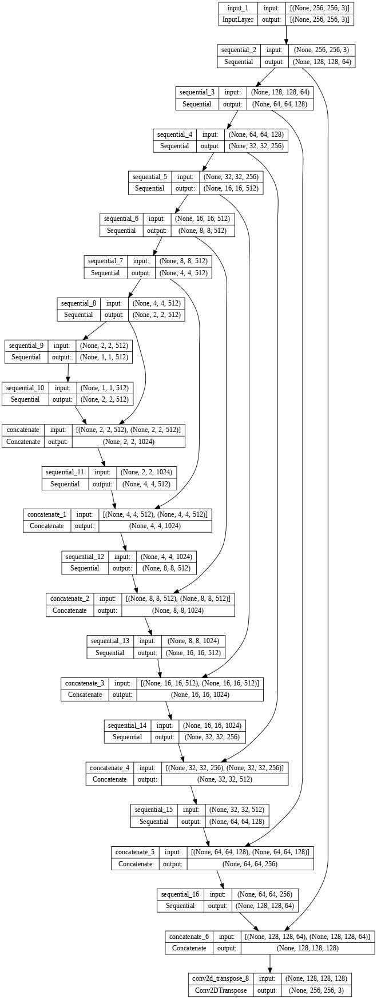

In [35]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes = True, dpi = 64)

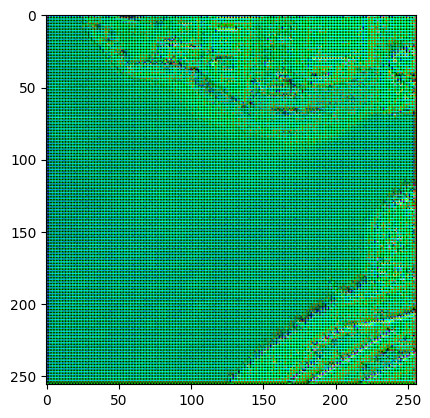

In [36]:
#Visualising the generator output;result is not good as it is not yet trained
g_output = generator(original_img[tf.newaxis, ...], training=False)
plt.imshow(g_output[0, ...])

### Generator loss

Normal GANs learn loss that adapts to the data, while cGAN learns structured loss that penalizes a possible structure that differs from the network output and the expected "real" image. More details: https://arxiv.org/abs/1611.07004


> **Hyperparameters**

Default values suggested in the paper

* Learning rate: 0.0002
* Momentum: [β1, β2] = [0.5, 0.999]
* Lambda (λ_L1) = 100

* The generator loss is a cross-entropy sigmoid of the generated images and an array of 1's
* The pix2pix paper also mentions L1 loss, which is a MAE (Mean Absolute Error) between the generated image and the expected (real) one. This ensures that the generated image becomes structurally similar to the real image.
* The equation for calculating the total loss is gan_loss + LAMBDA * l1_loss where LAMBDA = 100 - this value is also described by the authors of the paper.

In [37]:
lr = 0.0002
beta1, beta2 = 0.5, 0.999
lambda_ = 100

In [38]:
#from_logits is true as no actvn fn used in the output
loss = tf.keras.losses.BinaryCrossentropy(from_logits = True)

In [39]:
def generator_loss(d_generated_output, g_output, target):
  gan_loss = loss(tf.ones_like(d_generated_output), d_generated_output)
  #Compare the images pixel by pixel
  l1_loss = tf.reduce_mean(tf.abs(target - g_output)) # MAE
  g_loss_total = gan_loss + (lambda_ * l1_loss)
  return g_loss_total, gan_loss, l1_loss

## Discriminator

The discriminator is a [PatchGAN](https://paperswithcode.com/method/patchgan). The goal is to classify if each patch (piece) of the image is real or fake.

* Blocks of the discriminator: Convolution -> Batch normalization -> Leaky ReLU.

* The output shape is `(batch_size, 30, 30, 1)`

More information: https://arxiv.org/abs/1611.07004

The discriminator receives two inputs:
  1. The input image and the expected image, which should be classified as real
  2. The input image and the generated image (fake, generated by the generator), which should be classified as fake.

In [40]:
def Discriminator():
  #Initialize weights
  initializer = tf.random_normal_initializer(0., 0.02)

  original = tf.keras.layers.Input(shape = [256,256,3], name='original_img')
  transformed = tf.keras.layers.Input(shape=[256,256,3], name='transformed_img')
  #Total channels will be 3 * 2 =6
  x = tf.keras.layers.concatenate([original, transformed]) # (batch_size, 256, 256, channels * 2)

  down1 = encode(64, 4, False)(x) # (batch_size, 128, 128, 64)
  down2 = encode(128, 4)(down1) # (batch_size, 64, 64, 128)
  down3 = encode(256, 4)(down2) # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides = 1, kernel_initializer=initializer, use_bias=False)(zero_pad1) # (batch_size, 31, 31, 512)
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (batch_size, 33, 33, 512)
  last = tf.keras.layers.Conv2D(1, 4, strides = 1, kernel_initializer=initializer)(zero_pad2) # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs = [original, transformed], outputs = last)

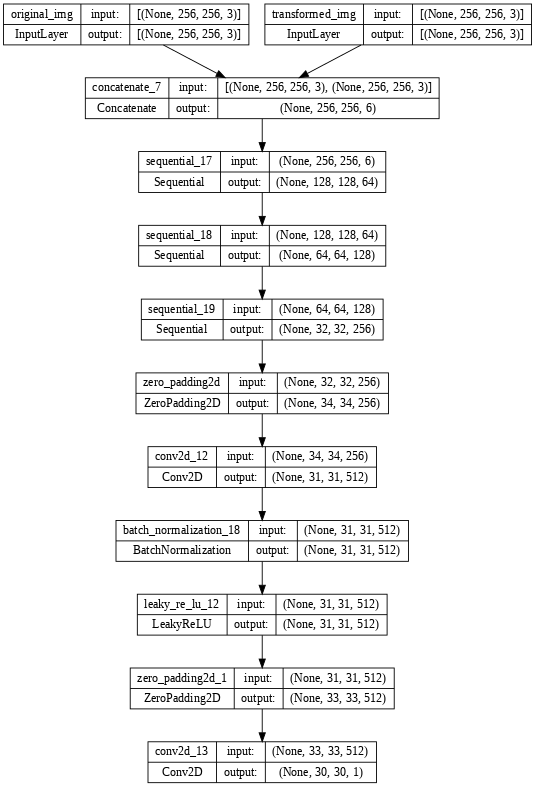

In [41]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes = True, dpi = 64)

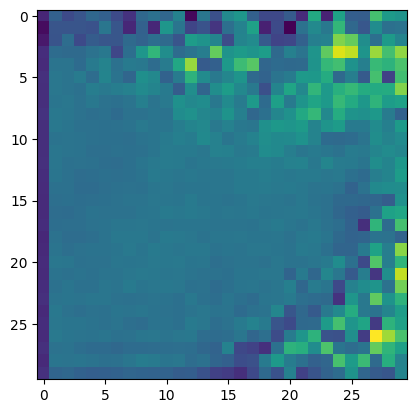

In [42]:
d_output = discriminator([original_img[tf.newaxis, ...], g_output], training=False)
plt.imshow(d_output[0, ..., -1])

### Discriminator loss

It receives two inputs: real images and generated (fake) images
* `real_loss` - sigmoid cross-entropy loss comparing the **real** image and one array of 1's
* `generated_loss (fake)` - sigmoid cross-entropy loss comparing the **generated** image and one array of 0's

The total loss is a sum of both losses

In [43]:
def discriminator_loss(d_real_output, d_generated_output):
  real_loss = loss(tf.ones_like(d_real_output), d_real_output)
  generated_loss = loss(tf.zeros_like(d_generated_output), d_generated_output)
  d_total_loss = real_loss + generated_loss
  return d_total_loss

## Optimizers

In [44]:
generator_optimizer = tf.keras.optimizers.Adam(lr, beta_1 = beta1, beta_2 = beta2)
discriminator_optimizer = tf.keras.optimizers.Adam(lr, beta_1 = beta1, beta_2 = beta2)

## Model checkpoint


In [45]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer = generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

## Generating images

In [46]:
def generate_images(model, test_input, real, step = None):
  generated_img = model(test_input, training=True)
  plt.figure(figsize=(12,8))

  img_list = [test_input[0], real[0], generated_img[0]]
  title = ['Input image', 'Real (ground truth)', 'Generated image (fake)']

  for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.title(title[i])
    plt.imshow(img_list[i] * 0.5 + 0.5)
    plt.axis('off')

  if step is not None:
    plt.savefig('result_pix2pix_step_{}.png'.format(step), bbox_inches='tight')

  plt.show()

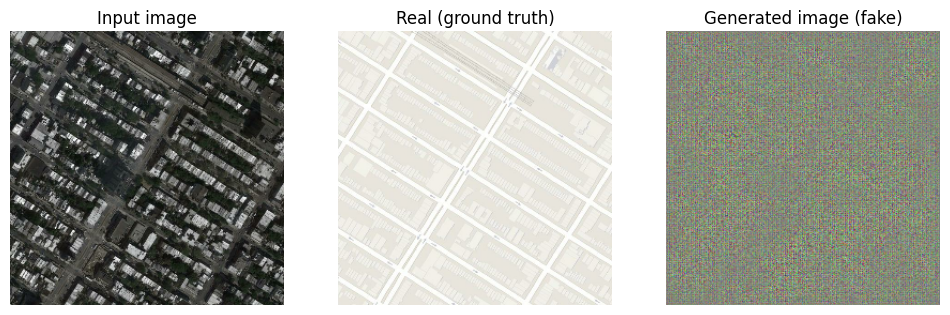

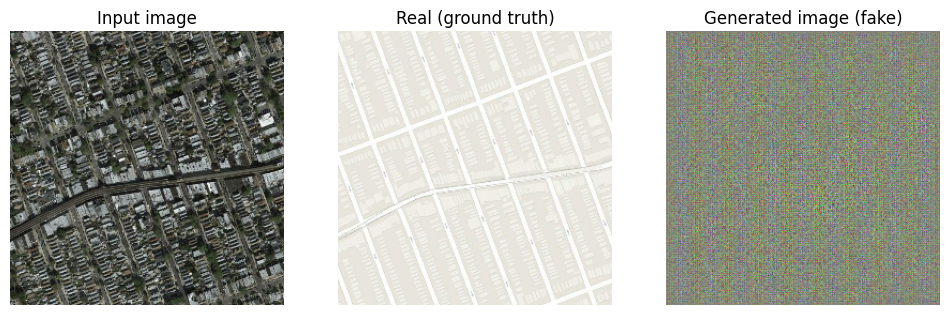

In [47]:
for input_example, real_example in testing_dataset.take(2):
  generate_images(generator, input_example, real_example)
  #Output is not good as generator is not yet trained

## Training

* For each input, an output is generated.
* The discriminator receives input_img and the generated images as the first input. The second input is img_entry and the "real" (expected)
* Then, the loss of the generator and discriminator is calculated
* Then we calculate the loss gradients with respect to the generator and discriminator variables (inputs) and apply these to the optimizer.

In [48]:
path_log = 'logs/'
metrics = tf.summary.create_file_writer(path_log + 'fit/' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [49]:
@tf.function
def training_step(generator,input_img, real, step):
  with tf.GradientTape() as g_tape, tf.GradientTape() as d_tape:
    g_output = generator(input_img, training = True)

    d_output_real = discriminator([input_img, real], training = True)
    d_output_generated = discriminator([input_img, g_output], training = True)

    g_total_loss, g_loss_gan, g_loss_l1 = generator_loss(d_output_generated, g_output, real)
    d_loss = discriminator_loss(d_output_real, d_output_generated)
  #gets the direction of updating the weights
  generator_gradients = g_tape.gradient(g_total_loss, generator.trainable_variables)
  discriminator_gradients = d_tape.gradient(d_loss, discriminator.trainable_variables)

  #Updates the weights
  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  with metrics.as_default():
    #Store merics values every thousand steps for later visualization
    tf.summary.scalar('g_total_loss', g_total_loss, step=step//1000)
    tf.summary.scalar('g_loss_gan', g_loss_gan, step=step//1000)
    tf.summary.scalar('g_loss_l1', g_loss_l1, step=step//1000)
    tf.summary.scalar('d_loss', d_loss, step=step//1000)

In [50]:
def train(generator,training_dataset, testing_dataset, steps):
  #test_input is satellite img,real_input=map img
  test_input, real_input = next(iter(testing_dataset.take(1)))
  start = time.time()
 #repeat reinitializes the dataset after reading to first
  for step, (input_img, real_img) in training_dataset.repeat().take(steps).enumerate():
    #For every 1000 steps generate images from generator using testing dataset which are visualized
    if step % 1000 == 0:
      #Clear the prev putput to show the latest output
      display.clear_output(wait = True)
      if step != 0:
        print(f'Time taken to run 1000 steps: {time.time() - start:.2f} seconds\n')
      start = time.time()
      generate_images(generator, test_input, real_input, step)
      print(f'Step: {step//1000}K')
    training_step(generator,input_img, real_img, step)
    #Visualize the progress with ..
    if (step + 1) % 10 == 0:
      print('.', end = '', flush = True)
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)
      generator.save_weights('model_pix2pix.h5')

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir {path_log}

<IPython.core.display.Javascript object>

Time taken to run 1000 steps: 89.51 seconds



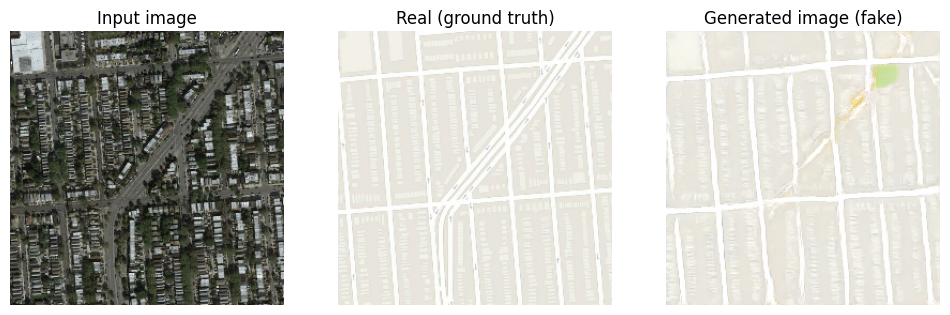

Step: 39K
....................................................................................................

In [ ]:
train(training_dataset, testing_dataset, steps = 40000) # 40000

In [ ]:
generator.save('gen_model_pix2pix.h5')

### Comments about training

* Note that neither the generator nor the discriminator "win" over each other. If either the `g_loss_gan` or the `d_loss` are too low, it is an indicator that one is dominating the other, which means that it is not training the two together as it should.
* The value `log(2) = 0.69` is a good reference point for these losses, as it indicates that the discriminator is generally uncertain about its evaluation (true or false)
* Considering `d_loss`, a value below 0.69 means that the discriminator is doing better than a random classification on the combined set of real and generated images.
* Considering `g_loss_gan`, a value below 0.69 means that the trained generator is fooling the discriminator better than if it were just random generation
* During training, `g_loss_l1` should decrease.

## Checkpoint restoration

In [ ]:
tf.train.latest_checkpoint(checkpoint_dir)

'./training_checkpoints/ckpt-4'

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

Time taken to run 1000 steps: 90.55 seconds



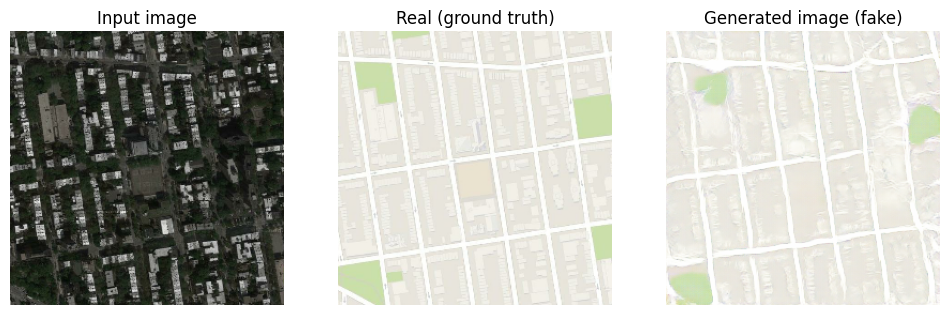

Step: 19K
....................................................................................................

In [ ]:
#Resuming training for another 20000
train(generator,training_dataset, testing_dataset, steps = 20000) # Train at least for 40000

In [ ]:
#Test the trained model for sample images
model2 = Generator()
model2.load_weights('/content/model_pix2pix.h5')

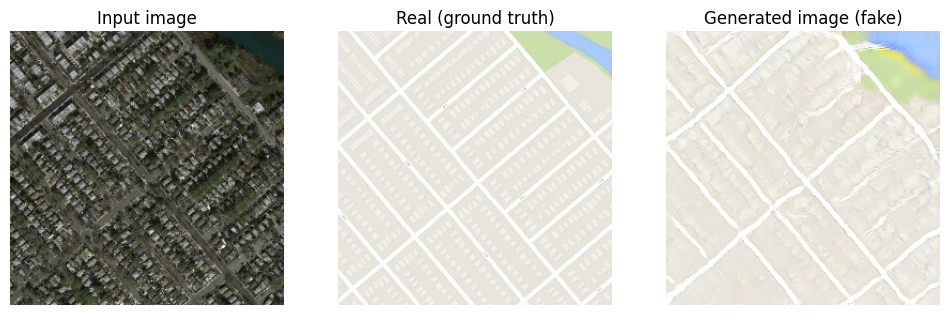

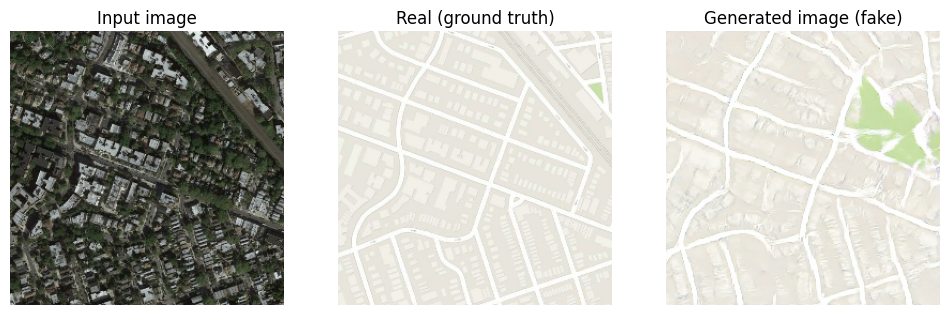

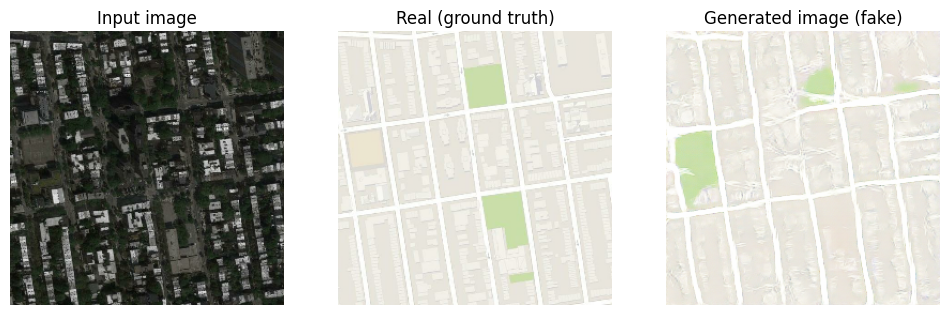

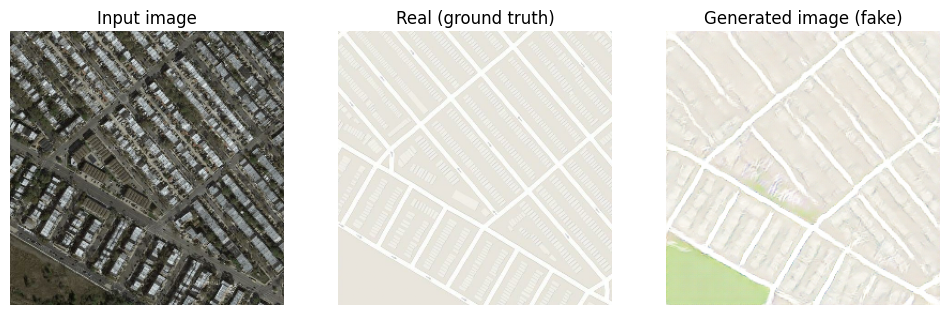

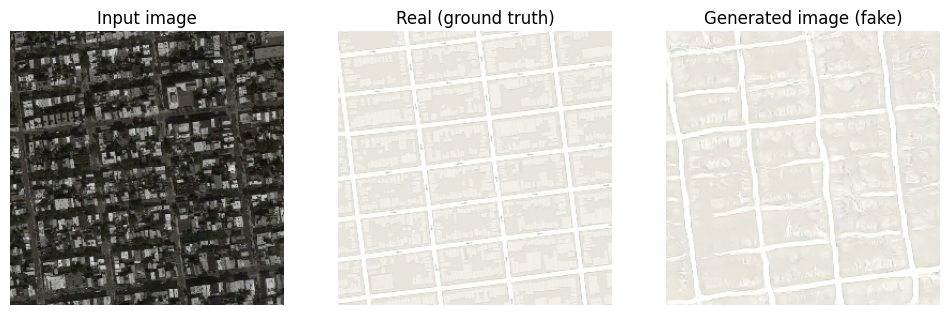

In [ ]:
for s, m in testing_dataset.take(5):
  generate_images(model2, s, m)

Implemetations used for reference:
* https://github.com/affinelayer/pix2pix-tensorflow/blob/master/pix2pix.py
* https://www.tensorflow.org/tutorials/generative/pix2pix


## Sample testing with the saved weights and model

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#Load the model for testing
from tensorflow.keras.models import load_model
model2 = load_model('/content/drive/MyDrive/MyAIPracticePjts/GANS/Maps_pix2pix_model/gen_model_pix2pix.h5')
model2.load_weights('/content/drive/MyDrive/MyAIPracticePjts/GANS/Maps_pix2pix_model/model_pix2pix.h5')

Time taken to run 1000 steps: 88.49 seconds



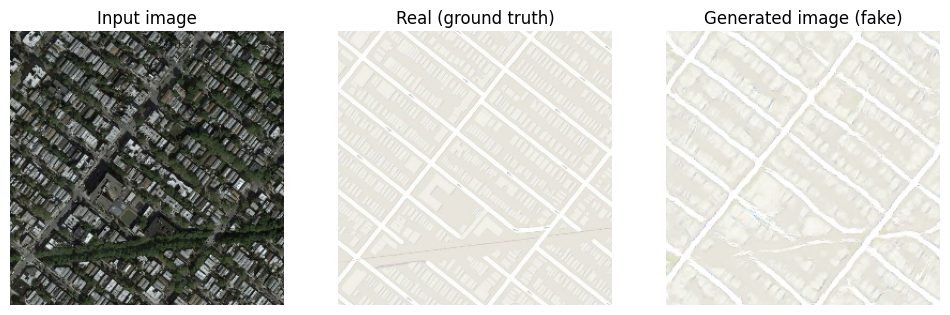

Step: 19K
....................................................................................................

In [51]:
#Resume training of the model
train(model2,training_dataset, testing_dataset, steps = 20000)

In [52]:
generator.save('gen_model_pix2pix.h5')

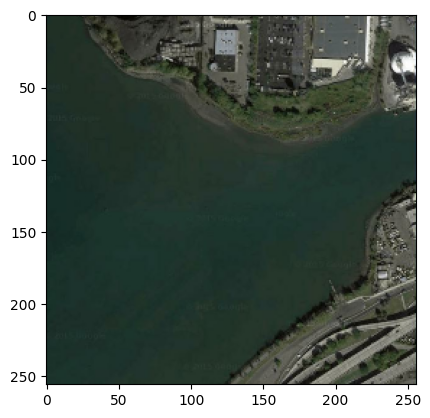

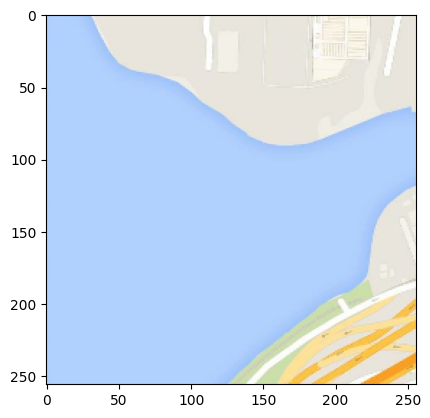

In [ ]:
original_img, transformed_img = load_image(str(path / 'train/7.jpg'))
plt.figure()
plt.imshow(original_img / 255.0)
plt.figure()
plt.imshow(transformed_img / 255.0);

In [ ]:
original_img.shape

TensorShape([256, 256, 3])

(256, 256, 3)


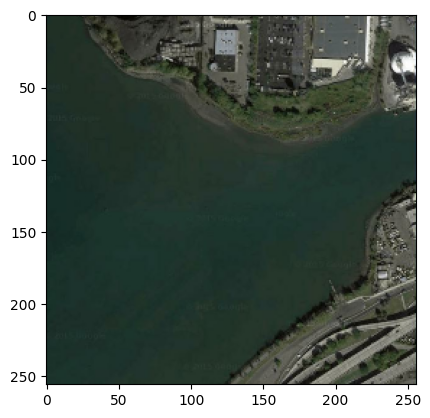

In [ ]:
print(original_img.shape)
plt.imshow(original_img/255);